# SANTANDER CUSTOMER TRANSACTION PREDICTION

## Problem Statement:
### In this challenge, we need to identify which customers will make a specific transaction in the future, irrespective of the amount of money transacted.

#### The data provided to us is anonymous and contains numeric values only. The data contains 200,000 rows in both train and test data. We are provided with 2 CSV files:
1. train.csv - The training dataset
2. test.csv - The dataset on which we will test our prediction.

In [245]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
import lightgbm as lgb
import pickle

from sklearn.model_selection import train_test_split,cross_val_predict,cross_val_score
from sklearn.ensemble import RandomForestClassifier
from pdpbox import pdp, get_dataset, info_plots
from sklearn.model_selection import StratifiedKFold
from scipy import special
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,roc_auc_score,roc_curve,classification_report,roc_curve,auc
from eli5.sklearn import PermutationImportance
from imblearn.over_sampling import SMOTE



In [179]:
# Importing the datasets

df_train = pd.read_csv('/Input/train.csv')
df_test =  pd.read_csv('/Input/test.csv')

In [180]:
#Summarze Training Dataset

print("Total Rows in Training Set     :", df_train.shape[0])
print("Total Columns in Training Set  :", df_train.shape[1])
print("\n")
print("Features:\n", df_train.columns.tolist())
print("\n")
print("Missing Values in Training Set :", df_train.isnull().values.sum())

Total Rows in Training Set     : 200000
Total Columns in Training Set  : 202


Features:
 ['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4', 'var_5', 'var_6', 'var_7', 'var_8', 'var_9', 'var_10', 'var_11', 'var_12', 'var_13', 'var_14', 'var_15', 'var_16', 'var_17', 'var_18', 'var_19', 'var_20', 'var_21', 'var_22', 'var_23', 'var_24', 'var_25', 'var_26', 'var_27', 'var_28', 'var_29', 'var_30', 'var_31', 'var_32', 'var_33', 'var_34', 'var_35', 'var_36', 'var_37', 'var_38', 'var_39', 'var_40', 'var_41', 'var_42', 'var_43', 'var_44', 'var_45', 'var_46', 'var_47', 'var_48', 'var_49', 'var_50', 'var_51', 'var_52', 'var_53', 'var_54', 'var_55', 'var_56', 'var_57', 'var_58', 'var_59', 'var_60', 'var_61', 'var_62', 'var_63', 'var_64', 'var_65', 'var_66', 'var_67', 'var_68', 'var_69', 'var_70', 'var_71', 'var_72', 'var_73', 'var_74', 'var_75', 'var_76', 'var_77', 'var_78', 'var_79', 'var_80', 'var_81', 'var_82', 'var_83', 'var_84', 'var_85', 'var_86', 'var_87', 'var_88', 'var_89'

In [181]:
#Summarze Testing Dataset

print("Total Rows in Testing Set     :", df_test.shape[0])
print("Total Columns in Testing Set  :", df_test.shape[1])
print("\n")
print("Features:\n", df_test.columns.tolist())
print("\n")
print("Missing Values in Testing Set :", df_test.isnull().values.sum())

Total Rows in Testing Set     : 200000
Total Columns in Testing Set  : 201


Features:
 ['ID_code', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4', 'var_5', 'var_6', 'var_7', 'var_8', 'var_9', 'var_10', 'var_11', 'var_12', 'var_13', 'var_14', 'var_15', 'var_16', 'var_17', 'var_18', 'var_19', 'var_20', 'var_21', 'var_22', 'var_23', 'var_24', 'var_25', 'var_26', 'var_27', 'var_28', 'var_29', 'var_30', 'var_31', 'var_32', 'var_33', 'var_34', 'var_35', 'var_36', 'var_37', 'var_38', 'var_39', 'var_40', 'var_41', 'var_42', 'var_43', 'var_44', 'var_45', 'var_46', 'var_47', 'var_48', 'var_49', 'var_50', 'var_51', 'var_52', 'var_53', 'var_54', 'var_55', 'var_56', 'var_57', 'var_58', 'var_59', 'var_60', 'var_61', 'var_62', 'var_63', 'var_64', 'var_65', 'var_66', 'var_67', 'var_68', 'var_69', 'var_70', 'var_71', 'var_72', 'var_73', 'var_74', 'var_75', 'var_76', 'var_77', 'var_78', 'var_79', 'var_80', 'var_81', 'var_82', 'var_83', 'var_84', 'var_85', 'var_86', 'var_87', 'var_88', 'var_89', 'var_90', 

In [182]:
#Summary of train dataset

df_train.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [183]:
#Summary of test dataset

df_test.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.658737,-1.624244,10.707452,6.788214,11.076399,-5.050558,5.415164,16.529143,0.277135,7.569407,...,3.189766,7.458269,1.925944,3.322016,17.996967,-0.133657,2.290899,8.912428,15.869184,-3.246342
std,3.036716,4.040509,2.633888,2.052724,1.616456,7.869293,0.864686,3.424482,3.333375,1.231865,...,4.551239,3.025189,1.479966,3.995599,3.140652,1.429678,5.446346,0.920904,3.008717,10.398589
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300,...,-14.093300,-2.407000,-3.340900,-11.413100,9.382800,-4.911900,-13.944200,6.169600,6.584000,-39.457800
25%,8.442975,-4.700125,8.735600,5.230500,9.891075,-11.201400,4.772600,13.933900,-2.303900,6.623800,...,-0.095000,5.166500,0.882975,0.587600,15.634775,-1.160700,-1.948600,8.260075,13.847275,-11.124000
50%,10.513800,-1.590500,10.560700,6.822350,11.099750,-4.834100,5.391600,16.422700,0.372000,7.632000,...,3.162400,7.379000,1.892600,3.428500,17.977600,-0.162000,2.403600,8.892800,15.943400,-2.725950
75%,12.739600,1.343400,12.495025,8.327600,12.253400,0.942575,6.005800,19.094550,2.930025,8.584825,...,6.336475,9.531100,2.956000,6.174200,20.391725,0.837900,6.519800,9.595900,18.045200,4.935400
max,22.323400,9.385100,18.714100,13.142000,16.037100,17.253700,8.302500,28.292800,9.665500,11.003600,...,20.359000,16.716500,8.005000,17.632600,27.947800,4.545400,15.920700,12.275800,26.538400,27.907400


In [184]:
# Shape of Datasets

df_train.shape, df_test.shape
df_train.head()


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [185]:
# Target variable anaylsis from training data

target_class = df_train['target'].value_counts()
print("Target variable value counts: \n", target_class)

Target variable value counts: 
 0    179902
1     20098
Name: target, dtype: int64


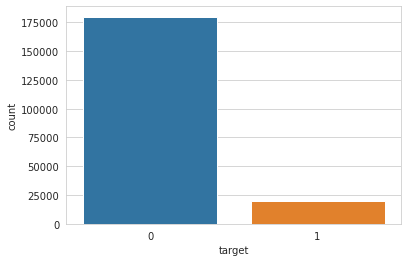

In [186]:
# Univariate analysis

sns.countplot(df_train['target'])

## Missing Value Analysis

In this, we have to find out any missing values are present in dataset. If it’s present then either delete or impute the values using mean, median and KNN imputation method. There are no missing values found in both train and test data.

In [187]:
# Check for missing values in training data
missing_train = df_train[df_train.isnull().any(axis = 1)]
print(missing_train)

Empty DataFrame
Columns: [ID_code, target, var_0, var_1, var_2, var_3, var_4, var_5, var_6, var_7, var_8, var_9, var_10, var_11, var_12, var_13, var_14, var_15, var_16, var_17, var_18, var_19, var_20, var_21, var_22, var_23, var_24, var_25, var_26, var_27, var_28, var_29, var_30, var_31, var_32, var_33, var_34, var_35, var_36, var_37, var_38, var_39, var_40, var_41, var_42, var_43, var_44, var_45, var_46, var_47, var_48, var_49, var_50, var_51, var_52, var_53, var_54, var_55, var_56, var_57, var_58, var_59, var_60, var_61, var_62, var_63, var_64, var_65, var_66, var_67, var_68, var_69, var_70, var_71, var_72, var_73, var_74, var_75, var_76, var_77, var_78, var_79, var_80, var_81, var_82, var_83, var_84, var_85, var_86, var_87, var_88, var_89, var_90, var_91, var_92, var_93, var_94, var_95, var_96, var_97, ...]
Index: []

[0 rows x 202 columns]


In [188]:
# Check for missing values in testing data
missing_test = df_test[df_test.isnull().any(axis = 1)]
print(missing_test)

Empty DataFrame
Columns: [ID_code, var_0, var_1, var_2, var_3, var_4, var_5, var_6, var_7, var_8, var_9, var_10, var_11, var_12, var_13, var_14, var_15, var_16, var_17, var_18, var_19, var_20, var_21, var_22, var_23, var_24, var_25, var_26, var_27, var_28, var_29, var_30, var_31, var_32, var_33, var_34, var_35, var_36, var_37, var_38, var_39, var_40, var_41, var_42, var_43, var_44, var_45, var_46, var_47, var_48, var_49, var_50, var_51, var_52, var_53, var_54, var_55, var_56, var_57, var_58, var_59, var_60, var_61, var_62, var_63, var_64, var_65, var_66, var_67, var_68, var_69, var_70, var_71, var_72, var_73, var_74, var_75, var_76, var_77, var_78, var_79, var_80, var_81, var_82, var_83, var_84, var_85, var_86, var_87, var_88, var_89, var_90, var_91, var_92, var_93, var_94, var_95, var_96, var_97, var_98, ...]
Index: []

[0 rows x 201 columns]


Missing values are not present in either training data nor in testing data.


<Figure size 432x288 with 0 Axes>

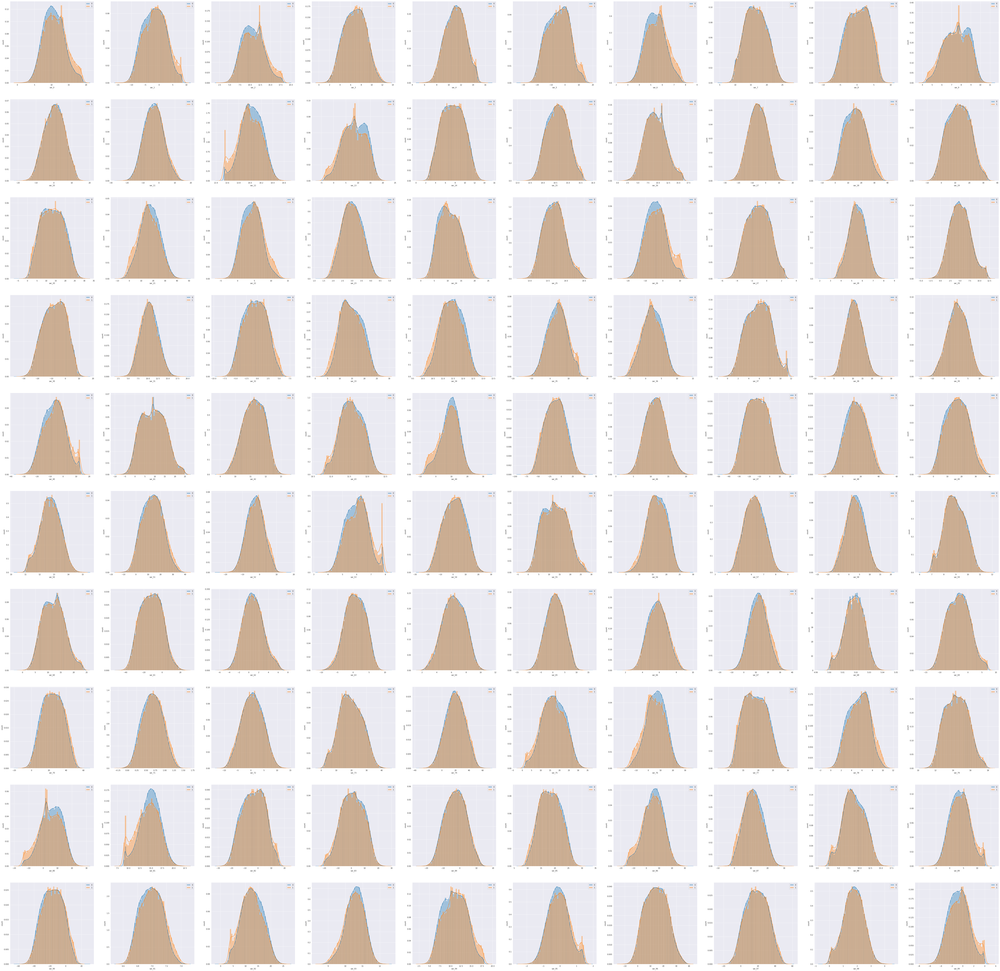

In [189]:
def plot_train_attribute_distribution(t0, t1, label1, label2, train_attributes):
    i = 0;
    sns.set_style("darkgrid")
    
    fig = plt.figure()
    plt.subplots(10, 10, figsize = (100, 100))
    
    for attribute in train_attributes:
        i += 1
        plt.subplot(10, 10, i)
        sns.distplot(t0[attribute], label = label1)
        sns.distplot(t1[attribute], label = label2)
        plt.legend()
        plt.xlabel(attribute)
        plt.ylabel("count")
        #sns.set_style("ticks", {"xtick.major.size" : 20, "ytick.major.size" : 20})
    plt.show()




target_0 = df_train[df_train["target"] == 0]
target_1 = df_train[df_train["target"] == 1]

#train attributes from 2 to 102 -
train_attributes=df_train.columns.values[2:102]
#Plot distribution of train attributes
plot_train_attribute_distribution(target_0,target_1,'0','1',train_attributes)

In [190]:
# Outlier analysis using Chauvenet's criterion

def chauvenet(array):
    mean = array.mean()             # Mean of input array
    stdv = array.std()            # Standard deviation of input array
    N = len(array)                  # Length of input array
    criterion = 1.0 / (2 * N)       # Chauvenet's criterion
    d = abs(array-mean)/stdv        # Distance of a value to mean in stdv's
    prob = special.erfc(d)                  # Area normal dist.    
    return prob < criterion         # Use boolean array outside this function

In [191]:
numerical_features = df_train.columns[2:]

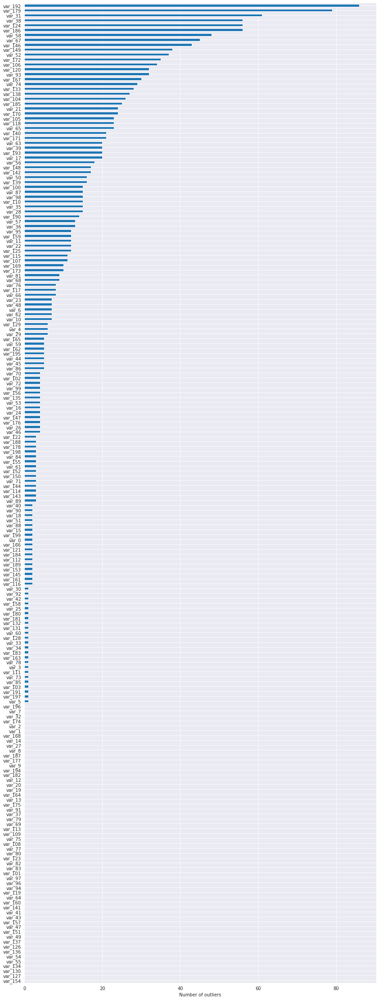

In [192]:
# outliers in each variable in train data 
train_outliers = dict()
for col in [col for col in numerical_features]:
    train_outliers[col] = df_train[chauvenet(df_train[col].values)].shape[0]
train_outliers = pd.Series(train_outliers)

train_outliers.sort_values().plot(figsize=(14, 40), kind='barh').set_xlabel('Number of outliers');

In [193]:
print('Total number of outliers in training set: {} ({:.2f}%)'.format(sum(train_outliers.values), (sum(train_outliers.values) / df_train.shape[0]) * 100))

Total number of outliers in training set: 1740 (0.87%)


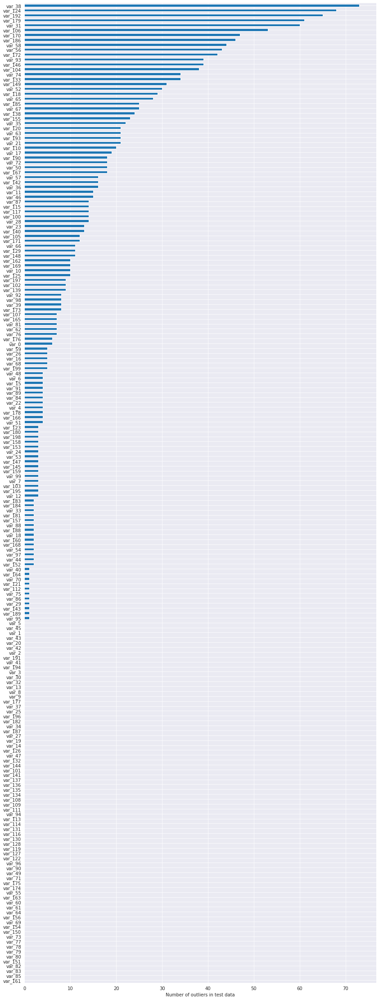

In [194]:
#outliers in each variable in test data 
test_outliers = dict()
for col in [col for col in numerical_features]:
    test_outliers[col] = df_test[chauvenet(df_test[col].values)].shape[0]
test_outliers = pd.Series(test_outliers)

test_outliers.sort_values().plot(figsize=(14, 40), kind='barh').set_xlabel('Number of outliers in test data');

In [195]:
print('Total number of outliers in testing set: {} ({:.2f}%)'.format(sum(test_outliers.values), (sum(test_outliers.values) / df_test.shape[0]) * 100))

Total number of outliers in testing set: 1748 (0.87%)


In [196]:
#remove these outliers in train and test data
for col in numerical_features:
    train = df_train.loc[(~chauvenet(df_train[col].values))]
for col in numerical_features:
    test = df_test.loc[(~chauvenet(df_test[col].values))]    

In [197]:
#shape of train and test data after removal of outliers 
train.shape,test.shape

((199998, 202), (199995, 201))

In [198]:
#Describe train data
train.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,...,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000,199998.000000
mean,0.100486,10.679883,-1.627596,10.715197,6.796536,11.078329,-5.065286,5.408951,16.545859,0.284139,...,3.234473,7.438389,1.927839,3.331761,17.993803,-0.142089,2.303247,8.908165,15.870717,-3.326182
std,0.300648,3.040046,4.050054,2.640907,2.043328,1.623154,7.863292,0.866603,3.418084,3.332639,...,4.559925,3.023217,1.478430,3.992047,3.135172,1.429379,5.454319,0.921627,3.010959,10.437463
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-37.696200
25%,0.000000,8.453750,-4.739950,8.722425,5.254025,9.883125,-11.200250,4.767700,13.943825,-2.317800,...,-0.058800,5.157425,0.889725,0.584600,15.629800,-1.170700,-1.946975,8.252800,13.829700,-11.208100
50%,0.000000,10.524650,-1.608000,10.580000,6.825050,11.108250,-4.833150,5.385100,16.456800,0.393650,...,3.203650,7.347750,1.901300,3.396300,17.958050,-0.172700,2.408900,8.888200,15.934050,-2.819200
75%,0.000000,12.758200,1.358675,12.516700,8.324100,12.261100,0.924800,6.002975,19.102900,2.937875,...,6.406200,9.512475,2.949500,6.205800,20.396575,0.829600,6.556675,9.593300,18.064775,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [199]:
#Describe test data
test.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,...,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000,199995.000000
mean,10.658767,-1.624241,10.707452,6.788203,11.076418,-5.050593,5.415172,16.529114,0.277107,7.569397,...,3.189721,7.458272,1.925949,3.322053,17.996976,-0.133656,2.290754,8.912453,15.869209,-3.245452
std,3.036741,4.040455,2.633907,2.052713,1.616428,7.869250,0.864689,3.424502,3.333393,1.231865,...,4.551244,3.025218,1.479980,3.995567,3.140646,1.429675,5.446323,0.920891,3.008731,10.397193
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300,...,-14.093300,-2.407000,-3.340900,-11.413100,9.382800,-4.911900,-13.944200,6.169600,6.584000,-36.325100
25%,8.442950,-4.700000,8.735600,5.230500,9.891100,-11.201400,4.772600,13.933900,-2.303900,6.623800,...,-0.095000,5.166500,0.882900,0.587600,15.634800,-1.160700,-1.949200,8.260100,13.847250,-11.123500
50%,10.513800,-1.590500,10.560700,6.822300,11.099800,-4.834100,5.391600,16.422600,0.372000,7.632000,...,3.162400,7.379000,1.892600,3.428500,17.977600,-0.162000,2.403500,8.892800,15.943400,-2.724800
75%,12.739600,1.343400,12.495050,8.327600,12.253400,0.942500,6.005800,19.094600,2.930050,8.584800,...,6.336400,9.531100,2.956000,6.174200,20.391750,0.837900,6.519600,9.595900,18.045200,4.935700
max,22.323400,9.385100,18.714100,13.142000,16.037100,17.253700,8.302500,28.292800,9.665500,11.003600,...,20.359000,16.716500,8.005000,17.632600,27.947800,4.545400,15.920700,12.275800,26.538400,27.907400


Distribution of Columns


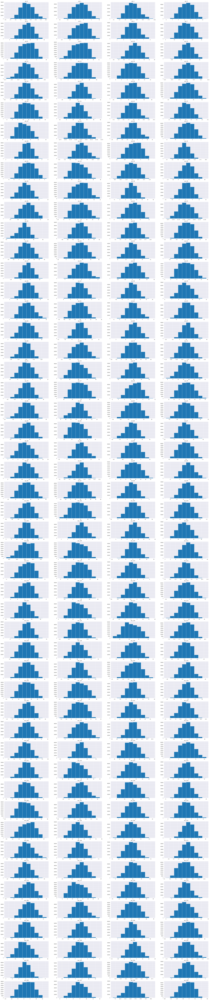

In [200]:
#hisograms are used to check distribution of data 
#draw histograms of numeric data in training set 
print("Distribution of Columns")
plt.figure(figsize=(40,200))
for i,col in enumerate(numerical_features):
    plt.subplot(50,4,i+1)
    plt.hist(train[col])
    plt.title(col)    

###### Almost all features have normal distributions.

Distribution of columns per target class


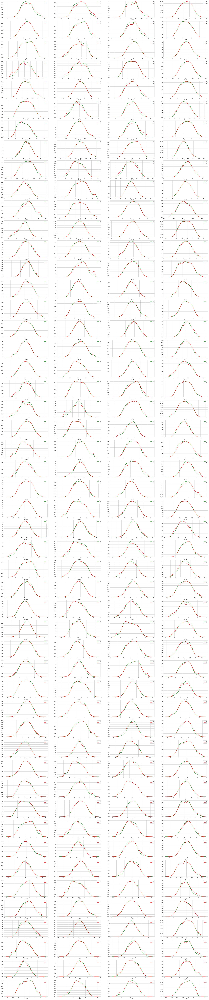

In [201]:
print("Distribution of columns per target class")
sns.set_style('whitegrid')
plt.figure(figsize=(40,200))
for i,col in enumerate(numerical_features):
    plt.subplot(50,4,i+1)
    sns.distplot(train[train['target']==0][col],hist=False,label='0',color='green')
    sns.distplot(train[train['target']==1][col],hist=False,label='1',color='red')
  

Distribution of columns for test and train datset


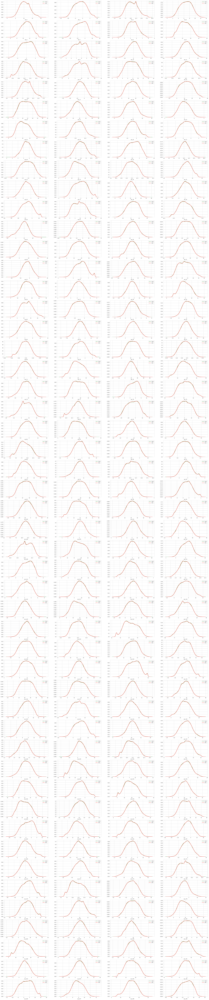

In [202]:
#Distribution of numeric variables in train and test data 
print("Distribution of columns for test and train datset")
sns.set_style('whitegrid')
plt.figure(figsize=(40,200))
for i,col in enumerate(numerical_features):
    plt.subplot(50,4,i+1)
    sns.distplot(train[col],hist=False,label='train',color='green')
    sns.distplot(test[col],hist=False,label='test',color='red')

###### The train and test seems to be well balanced with respect with distribution of the numeric variables.

Check for correlation between variables

In [203]:
%%time
#Correlation in train attiributes-
train_attributes=df_train.columns.values[2:202]
train_correlation=df_train[train_attributes].corr().abs().unstack().sort_values(kind='quicksort').reset_index()
train_correlation=train_correlation[train_correlation['level_0']!=train_correlation['level_1']]
print(train_correlation.head(10))
print(train_correlation.tail(10))

   level_0  level_1             0
0   var_75  var_191  2.703975e-08
1  var_191   var_75  2.703975e-08
2  var_173    var_6  5.942735e-08
3    var_6  var_173  5.942735e-08
4  var_126  var_109  1.313947e-07
5  var_109  var_126  1.313947e-07
6  var_144   var_27  1.772502e-07
7   var_27  var_144  1.772502e-07
8  var_177  var_100  3.116544e-07
9  var_100  var_177  3.116544e-07
       level_0  level_1         0
39790  var_183  var_189  0.009359
39791  var_189  var_183  0.009359
39792  var_174   var_81  0.009490
39793   var_81  var_174  0.009490
39794   var_81  var_165  0.009714
39795  var_165   var_81  0.009714
39796   var_53  var_148  0.009788
39797  var_148   var_53  0.009788
39798   var_26  var_139  0.009844
39799  var_139   var_26  0.009844
CPU times: user 17.6 s, sys: 291 ms, total: 17.9 s
Wall time: 17.9 s


In [204]:
%%time
#Correlation in test attiributes-
test_attributes=df_test.columns.values[1:201]
test_correlation=df_test[train_attributes].corr().abs().unstack().sort_values(kind='quicksort').reset_index()
test_correlation=test_correlation[test_correlation['level_0']!=test_correlation['level_1']]
print(test_correlation.head(10))
print(test_correlation.tail(10))

   level_0  level_1             0
0  var_154  var_175  1.477268e-07
1  var_175  var_154  1.477268e-07
2  var_188  var_113  1.639749e-07
3  var_113  var_188  1.639749e-07
4  var_131    var_8  4.695407e-07
5    var_8  var_131  4.695407e-07
6   var_60  var_189  9.523709e-07
7  var_189   var_60  9.523709e-07
8  var_159   var_96  1.147835e-06
9   var_96  var_159  1.147835e-06
       level_0  level_1         0
39790  var_122  var_164  0.008513
39791  var_164  var_122  0.008513
39792  var_164    var_2  0.008614
39793    var_2  var_164  0.008614
39794   var_31  var_132  0.008714
39795  var_132   var_31  0.008714
39796   var_96  var_143  0.008829
39797  var_143   var_96  0.008829
39798  var_139   var_75  0.009868
39799   var_75  var_139  0.009868
CPU times: user 17.6 s, sys: 149 ms, total: 17.8 s
Wall time: 17.8 s


**Observation:** Its visible that correlation between test attributes is very small.

**Correlation plot for train and test data:**

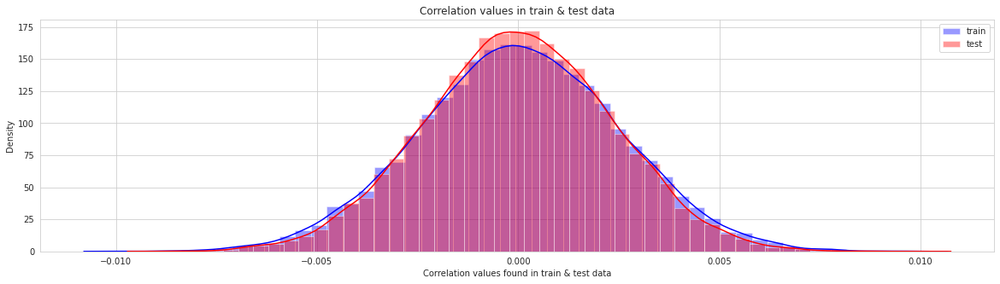

In [205]:
train_correlation=df_train[train_attributes].corr()
train_correlation=train_correlation.values.flatten()
train_correlation=train_correlation[train_correlation!=1]


test_correlation=df_test[test_attributes].corr()
test_correlation=test_correlation.values.flatten()
test_correlation=test_correlation[test_correlation!=1]

plt.figure(figsize=(20,5))
sns.distplot(train_correlation,color="blue",label="train")
sns.distplot(test_correlation,color="red",label="test")
plt.xlabel("Correlation values found in train & test data")
plt.ylabel("Density")
plt.title ("Correlation values in train & test data")
plt.legend()

**Observation:The correlation between the train and test data is very small, its completely visible from the above graph**

**Feature Engineering :-**
Performing feature engineering by using-
    - Permutation Importance
    - Partial dependence plots

**Building a simple model to find the features which are more important:**

In [206]:
#Training & testing data:
X=df_train.drop(columns=['ID_code','target'],axis=1)
test=df_test.drop(columns=['ID_code'],axis=1)
y=df_train['target']

**Random Forest Classifier:-**

In [207]:
#Split the train data:-
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42)

In [208]:
%%time
rf_model=RandomForestClassifier(n_estimators=10,random_state=42)

#fitting the model:-
rf_model.fit(X_test,y_test)

CPU times: user 25 s, sys: 37.5 ms, total: 25 s
Wall time: 25 s


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

**Calucating weights & Observing some Important features via using eli5 library-** ELI5 is a Python package which helps to debug machine learning classifiers and explain their predictions.

In [209]:
%%time
#Permutation Importance:-
perm_imp=PermutationImportance(rf_model,random_state=42)

#fitting the model:-
perm_imp.fit(X_test,y_test)

CPU times: user 3min 25s, sys: 14.6 s, total: 3min 40s
Wall time: 3min 40s


PermutationImportance(cv='prefit',
                      estimator=RandomForestClassifier(bootstrap=True,
                                                       ccp_alpha=0.0,
                                                       class_weight=None,
                                                       criterion='gini',
                                                       max_depth=None,
                                                       max_features='auto',
                                                       max_leaf_nodes=None,
                                                       max_samples=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                                       min_weight_fr

In [210]:
#Important Featuimport eli5
import eli5
eli5.show_weights(perm_imp, feature_names = X_test.columns.tolist(),top = 200)

Weight,Feature
0.0190 ± 0.0009,var_81
0.0174 ± 0.0005,var_139
0.0129 ± 0.0006,var_110
0.0112 ± 0.0008,var_53
0.0102 ± 0.0002,var_44
0.0094 ± 0.0004,var_76
0.0080 ± 0.0008,var_2
0.0077 ± 0.0009,var_148
0.0076 ± 0.0003,var_170
0.0076 ± 0.0003,var_12


**Observation:-**
    - Importance of features is decreasing as we move down the top of column.
    - Features showing in green indicates they are having positive impact on our prediction.
    - Features showing in white showing they have no impact on prediction.
    - Most imprtant feature is var_81.

**Partial Dependence Plots :-** PDP gives a graphical depiction of marginal effect of a variable on the class probability or classification.
    It shows how a feature effects predictions.

In [211]:
#Calculation of partial dependence plots on random forest:-
#we are observing impact of main features which are discovered in previous section by using PDP Plot.


features=[v for v in X_test.columns if v not in ['ID_code','target']]
pdp_data=pdp.pdp_isolate(rf_model, dataset=X_test, model_features=features, feature='var_6')

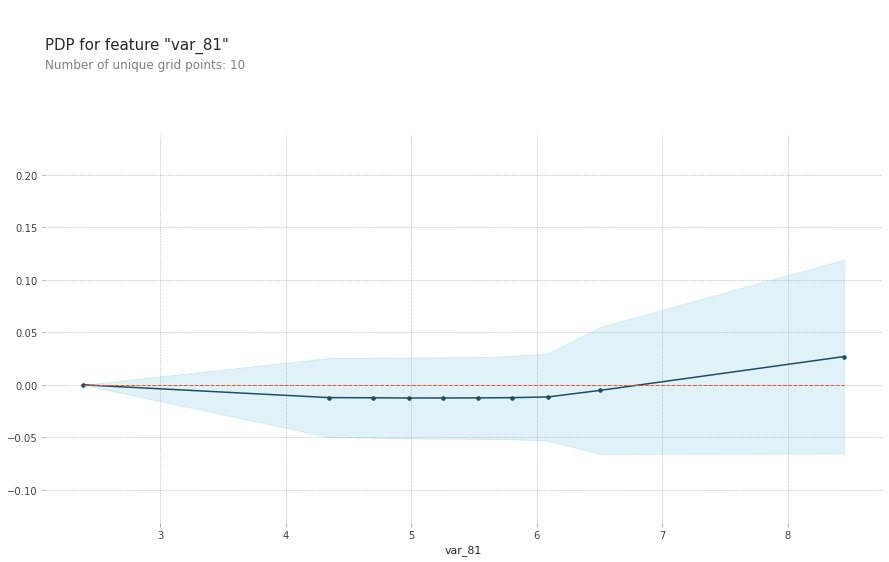

In [212]:
#Plot feature for var_6:-
pdp.pdp_plot(pdp_data,'var_81')
plt.show()

**Observation-**
    - The y axis dosen't show the predictor value instead how the value changing with the change in given predictor variable.
    - The blue shaded area indicates level of confidence of var_6.
    - On y-axis having a +ve value means for that particular value of predictor vriable its is less likely to predict the correct class & having & having a +ve value means it has +ve impact on predicting the correct class.

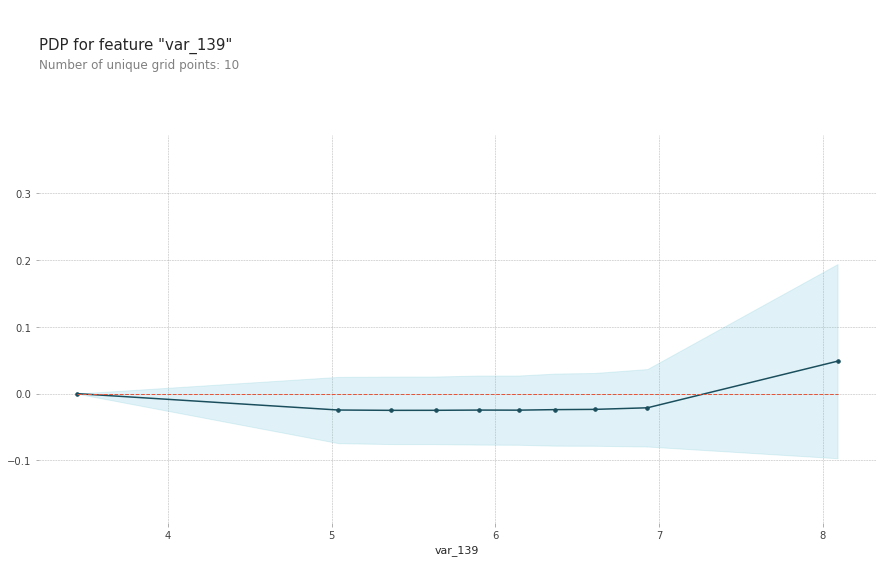

In [213]:
#Plot feature for var_53:-
pdp_data=pdp.pdp_isolate(rf_model, dataset=X_test, model_features=features, feature='var_53')
pdp.pdp_plot(pdp_data,'var_139')
plt.show()

**Observation-**
    - The y axis dosen't show the predictor value instead how the value changing with the change in given predictor variable.
    - The blue shaded area indicates level of confidence of var_53.
    - On y-axis having a +ve value means for that particular value of predictor vriable its is less likely to predict the correct class & having & having a +ve value means it has +ve impact on predicting the correct class.

**Handling of imblanced data:-** We are going to use multiple approaches for dealing with imbalanced datasets.
    
    - Change of performance matrix.
    - Oversample minority class.
    - Undersample majority class.
    - SMOTE ( Synthetic Minority Oversampling technique)
    - Change of algorithm.
    

In [214]:
#Spliting the data via Sratified KFold Cross Validator:-

#Training Data:
X=df_train.drop(['ID_code','target'],axis=1)
Y=df_train['target']

#Stratified KFold Cross Validator:-
skf=StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
for train_index, valid_index in skf.split(X,Y): 
    X_train, X_valid = X.iloc[train_index], X.iloc[valid_index] 
    y_train, y_valid = Y.iloc[train_index], Y.iloc[valid_index]
    
print('Shape of X_train :',X_train.shape)
print('Shape of X_valid :',X_valid.shape)
print('Shape of y_train :',y_train.shape)
print('Shape of y_valid :',y_valid.shape)

Shape of X_train : (160000, 200)
Shape of X_valid : (40000, 200)
Shape of y_train : (160000,)
Shape of y_valid : (40000,)


**Logistic Regression**

In [215]:
%%time
#Logistic Regression
lr_model=LogisticRegression(random_state=42)

#fitting the model-
lr_model.fit(X_train,y_train)

CPU times: user 12.1 s, sys: 144 ms, total: 12.2 s
Wall time: 6.24 s


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [216]:
#Accuracy of model-
lr_score=lr_model.score(X_train,y_train)
print('Accuracy of lr_model :',lr_score)

Accuracy of lr_model : 0.9122


In [217]:
%%time
#Cross validation prediction of lr_model-
cv_predict=cross_val_predict(lr_model,X_valid,y_valid,cv=5)

#Cross validation score-
cv_score=cross_val_score(lr_model,X_valid,y_valid,cv=5)
print('cross val score :',np.average(cv_score))

cross val score : 0.9102750000000001
CPU times: user 26.9 s, sys: 521 ms, total: 27.4 s
Wall time: 13.7 s


- Accuracy of the model is not th best metric to use while evaluating the imbalanced datasets as it may be misleading.
  We are going to change the performance metric.

In [218]:
#Confusion matrix:-
cm=confusion_matrix(y_valid,cv_predict)
cm=pd.crosstab(y_valid,cv_predict)
cm

col_0,0,1
target,,
0,35489,491
1,3098,922


In [219]:
#ROC_AUC SCORE:-
roc_score=roc_auc_score(y_valid,cv_predict)
print('ROC Score:',roc_score)

ROC Score: 0.6078533817847948


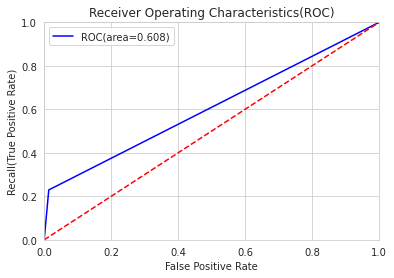

AUC: 0.6078533817847948


In [220]:
#ROC_AUC_Curve:-
plt.figure()
false_positive_rate,recall,thresholds=roc_curve(y_valid,cv_predict)
roc_auc=auc(false_positive_rate,recall)
plt.title('Receiver Operating Characteristics(ROC)')
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %roc_auc)
plt.legend()
plt.plot([0,1],[0,1],'r--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.ylabel('Recall(True Positive Rate)')
plt.xlabel('False Positive Rate')
plt.show()
print('AUC:',roc_auc)

**Observation:-** On comparing roc_auc_score and model accuracy, model is not performing well on imbalanced data.

In [221]:
#Classification report:-
classification_scores=classification_report(y_valid,cv_predict)
print(classification_scores)

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     35980
           1       0.65      0.23      0.34      4020

    accuracy                           0.91     40000
   macro avg       0.79      0.61      0.65     40000
weighted avg       0.89      0.91      0.89     40000



**Observation:-** As we see that f1 score is high for the customers who will not make a transaction, compare to those who will make a transaction.
    So, we are going to change the algorithm.

In [222]:
%%time
#Model performance on test data:-
X_test=df_test.drop(['ID_code'],axis=1)
lr_pred=lr_model.predict(X_test)
print(lr_pred)

[0 0 0 ... 0 0 0]
CPU times: user 179 ms, sys: 111 ms, total: 290 ms
Wall time: 256 ms


Confusion Martix:
[[142166   1756]
 [ 12292   3786]]
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95    143922
           1       0.68      0.24      0.35     16078

    accuracy                           0.91    160000
   macro avg       0.80      0.61      0.65    160000
weighted avg       0.90      0.91      0.89    160000



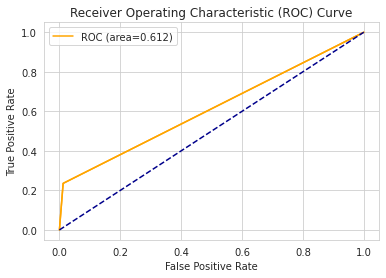

In [223]:
def plot_roc_curve(fper, tper):  
    plt.plot(fper, tper, color = 'orange')
    roc_auc = auc(fper, tper)
    plt.title('Receiver Operating Characteristics(ROC)')
    plt.plot(fper, tper, 'orange', label = 'ROC (area=%0.3f)' %roc_auc)
    plt.plot([0, 1], [0, 1], color = 'darkblue', linestyle = '--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()
    
    
lr_model_predict = lr_model.predict(X_train)

print("Confusion Martix:")
print(confusion_matrix(y_train, lr_model_predict))

print("Classification Report:")
print(classification_report(y_train, lr_model_predict))

FPR, TPR, thresholds_1 = roc_curve(y_train, lr_model_predict)
plot_roc_curve(FPR, TPR)

**Handling of imblanced data:-** We are going to use multiple approaches for dealing with imbalanced datasets.
    
    - Change of performance matrix.
    - Oversample minority class.
    - Undersample majority class.
    - SMOTE ( Synthetic Minority Oversampling technique)
    - Change of algorithm.

**Oversample Minority Class:-** 

    -Adding more copies of minority class.
    -It can be a good option we dont have that much large data to work.
    -Drawback of this process is we are adding info. That can lead to overfitting or poor performance on test data.

**Undersample Mojorityclass:-**
    
    -Removing some copies of majority class.
    -It can be a good option if we have very large amount of data say in millions to work.
    -Drawback of this process is we are removing some valuable info. that can leads to underfitting & poor performance on        test data.

As per the drawbacks of both the model we will use SMOTE ( Synthetic Minority Oversampling technique) that is more best than the above as compare to above one's.

**SMOTE ( Synthetic Minority Oversampling technique):-** This is a statistical technique for increasing the number of cases in your dataset in a balanced way. It uses a nearest neighbors algorithm to generate new and synthetic data to used for training the model.

In [224]:
%%time
#SMOTE:-
sm = SMOTE(random_state=42)

#Generating synthetic data points
X_smote, y_smote = sm.fit_sample(X_train, y_train)
X_smote_v, y_smote_v = sm.fit_sample(X_valid, y_valid)

CPU times: user 3min 29s, sys: 1.53 s, total: 3min 31s
Wall time: 3min 31s


In [225]:
%%time
#Logistic regression model for SMOTE:-
smote = LogisticRegression(random_state=42)

#Fitting the smote model:-
smote.fit(X_smote, y_smote)

CPU times: user 22 s, sys: 324 ms, total: 22.3 s
Wall time: 11.4 s


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [226]:
#Accuracy of the model:-
smote_score = smote.score(X_smote, y_smote)
print('Accuracy of the smote_model :', smote_score)

Accuracy of the smote_model : 0.7882637817706813


In [227]:
%%time
#Cross validation prediction for SMOTE:-
cv_pred = cross_val_predict(smote, X_smote_v, y_smote_v, cv=5)

#Cross validation score:-
cv_score = cross_val_score(smote, X_smote_v, y_smote_v, cv=5)
print('Cross validation score :', np.average(cv_score))

Cross validation score : 0.7967342968315732
CPU times: user 47.5 s, sys: 896 ms, total: 48.4 s
Wall time: 24.2 s


In [228]:
%%time
#Confusion matrix:-
cm=confusion_matrix(y_smote_v,cv_pred)
cm=pd.crosstab(y_smote_v,cv_pred)
cm

CPU times: user 280 ms, sys: 12.7 ms, total: 293 ms
Wall time: 146 ms


col_0,0,1
target,,
0,28218,7762
1,6865,29115


In [229]:
#ROC_AUC SCORE:-
roc_score = roc_auc_score(y_smote_v, cv_pred)
print('ROC score:', roc_score)

ROC score: 0.7967342968315732


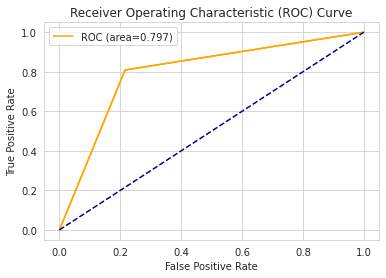

In [230]:
#ROC_AUC Curve:-
#plt.figure()
false_positive_rate, recall, thresholds = roc_curve(y_smote_v, cv_pred)
plot_roc_curve(false_positive_rate, recall)

#roc_auc=auc(false_positive_rate,recall)
#plt.title('Receiver Operating Characteristics(ROC)')
#plt.plot(false_positive_rate,recall,'blue',label='ROC(Area = %0.3f)' %roc_auc)
#plt.legend()
#plt.plot([0,1],[0,1],'r--')
#plt.xlim([0.0,1.0])
#plt.ylim([0.0,1.0])
#plt.ylabel('Recall(True Positive Rate)')
#plt.xlabel('False Positive Rate')
#plt.show()
#print('AUC:',roc_auc)

In [231]:
#Classification Report:-
scores = classification_report(y_smote_v, cv_pred)
print(scores)

              precision    recall  f1-score   support

           0       0.80      0.78      0.79     35980
           1       0.79      0.81      0.80     35980

    accuracy                           0.80     71960
   macro avg       0.80      0.80      0.80     71960
weighted avg       0.80      0.80      0.80     71960



In [232]:
%%time
#Predicting the model-
X_test = df_test.drop(['ID_code'], axis=1)
smote_pred = smote.predict(X_test)
print(smote_pred)

[1 1 0 ... 0 0 1]
CPU times: user 168 ms, sys: 111 ms, total: 279 ms
Wall time: 252 ms


**Observation:-** We can observe that the smote model is performing well on imbalance data as compare to logistic regression.

**Light GBM:-** It is a gradient boosting framework that uses tree based learning algorithm.

In [233]:
#Training data-
lgb_train=lgb.Dataset(X_train,label=y_train)

#Validation data-
lgb_valid=lgb.Dataset(X_valid,label=y_valid)

In [234]:
print(lgb_train)

In [235]:
#Selecting best hyperparameters by tuning of different parameters:-
params={'boosting_type': 'gbdt',
          'max_depth' : -1, #no limit for max_depth if <0
          'objective': 'binary',
          'boost_from_average':False, 
          'nthread': 20,
          'metric':'auc',
          'num_leaves': 50,
          'learning_rate': 0.01,
          'max_bin': 100,      #default 255
          'subsample_for_bin': 100,
          'subsample': 1,
          'subsample_freq': 1,
          'colsample_bytree': 0.8,
          'bagging_fraction':0.5,
          'bagging_freq':5,
          'feature_fraction':0.08,
          'min_split_gain': 0.45, #>0
          'min_child_weight': 1,
          'min_child_samples': 5,
          'is_unbalance':True,
          }

In [236]:
#Training lgbm model:-
num_rounds = 10000
lgbm = lgb.train(params, lgb_train, num_rounds, valid_sets = [lgb_train,lgb_valid],verbose_eval=1000,early_stopping_rounds = 5000)
lgbm

Training until validation scores don't improve for 5000 rounds
[1000]	training's auc: 0.938309	valid_1's auc: 0.887942
[2000]	training's auc: 0.957945	valid_1's auc: 0.892205
[3000]	training's auc: 0.971593	valid_1's auc: 0.893526
[4000]	training's auc: 0.981333	valid_1's auc: 0.894011
[5000]	training's auc: 0.988169	valid_1's auc: 0.893938
[6000]	training's auc: 0.992771	valid_1's auc: 0.893874
[7000]	training's auc: 0.995759	valid_1's auc: 0.893498
[8000]	training's auc: 0.997638	valid_1's auc: 0.893374
Early stopping, best iteration is:
[3804]	training's auc: 0.979706	valid_1's auc: 0.89418


In [237]:
lgbm_prediction = lgbm.predict(X, random_state = 42, num_iteration = lgbm.best_iteration)

In [238]:
#Convert to binary output
max = lgbm_prediction.shape[0]

for i in range(0, max):
    if lgbm_prediction[i] >= 0.5:
        lgbm_prediction[i] = 1
    else:
        lgbm_prediction[i] = 0
        
print(lgbm_prediction.shape)

(200000,)


In [239]:
print("Confusion Matrix")
print(confusion_matrix(Y, lgbm_prediction))
print()
print("Classification Report:")
print(classification_report(Y, lgbm_prediction))

Confusion Matrix
[[163177  16725]
 [  2073  18025]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.91      0.95    179902
           1       0.52      0.90      0.66     20098

    accuracy                           0.91    200000
   macro avg       0.75      0.90      0.80    200000
weighted avg       0.94      0.91      0.92    200000



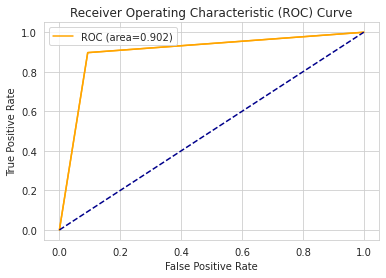

In [240]:
TPR, FPR, th = roc_curve(Y, lgbm_prediction)
plot_roc_curve(TPR, FPR)

#roc_auc = auc(TPR, FPR)
#plt.title('Receiver Operating Characteristics(ROC)')
#plt.plot(TPR, FPR,'blue',label='ROC (Area = %0.3f)' %roc_auc)
#plt.legend()
#plt.plot([0,1],[0,1],'r--')
#plt.xlim([0.0,1.0])
#plt.ylim([0.0,1.0])
#plt.ylabel('Recall(True Positive Rate)')
#plt.xlabel('False Positive Rate')
#plt.show()
#print('AUC:',roc_auc)

**Plotting of important Features:-**

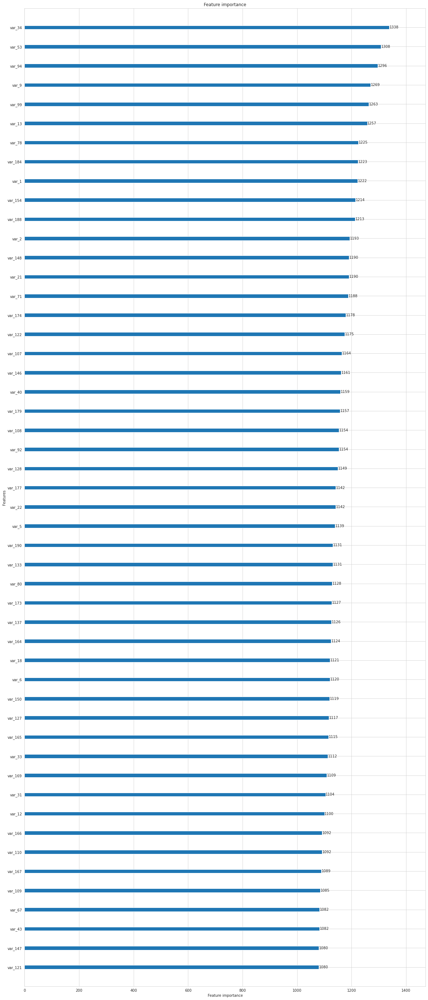

In [241]:
lgb.plot_importance(lgbm,max_num_features=50,importance_type="split",figsize=(20,50))

**Conclusion:-** We have tried with diff model like Logistic regression,smote & lightgbm. But we observed that light gbm is performing well on imbalanced data as compare to other models based on the roc_auc scores.

In [242]:
#Final submission:-
df_sub = pd.DataFrame({'ID_code':df_test['ID_code'].values})
df_sub['lgbm_prediction'] = lgbm_prediction
df_sub.to_csv('submission.csv',index=False)
df_sub.head()

,ID_code,lgbm_prediction
0,test_0,0.0
1,test_1,1.0
2,test_2,0.0
3,test_3,1.0
4,test_4,0.0


In [243]:
df_sub['lgbm_prediction'].value_counts()

0.0    165250
1.0     34750
Name: lgbm_prediction, dtype: int64

In [246]:
# Save the model

with open("santander_model.pkl", "wb") as f:
    pickle.dump(lgbm, f)


In [248]:
# Load the model

with open("santander_model.pkl", "rb") as f:
    load_model_lgbm = pickle.load(f)